<a href="https://colab.research.google.com/github/4nna/4nna.github.io/blob/master/transformXLM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##  Training Multi lingual Transformer for emotion classification ot Tweets

* layer wise learning rate
* label smoothing
* new regression loss / alternating with lsos for 8 emotions.
* 

new loss function should:
have higher penalty when a class is categorized as 4 when its 1 rather than 4 when its 3.
much higher penalty when class is misclassified. 
combine categorical and regression loss? with two heads? 
multilabel head: binary cross entropy and target mapped to 0-1
i.e. very negative logits for 0, very positive logits for 1
regression head for each category:
where logits  mapped to 0+ ? 

label smoothing


In [1]:
from google.colab import drive
drive.mount('/content/drive')
data_path = '/content/drive/My Drive/data/'
file_path = '/content/drive/My Drive/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#'/device:GPU:0'
import sys
import os
import gc
import re

import pandas as pd
import numpy as np

import torch
!pip install transformers
import transformers

from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
from collections import defaultdict

%load_ext tensorboard
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', 500)

sys.path.append(file_path)
from training import Trainer, Writer
from dataing import TweetDataset, DataHandler
from visualing import plot_roc


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
os.environ['PATH'] += ':/usr/local/cuda/bin'
print(torch.cuda.is_available())
print(torch.backends.cudnn.enabled)
#cuda = '/device:GPU:0'


True
True


In [4]:
# setting various random seeds
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
torch.cuda.manual_seed(RANDOM_SEED)


In [5]:
# Variables for model training
NUM_LABELS = 8
MAX_LEN = 256
BATCH_SIZE = 64
LR = 3e-5
EPOCHS = 4
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#scheduler:
sawtooth_up=4

#optimizer
weight_decay = 0.01

In [6]:
eng_train = pd.read_csv(os.path.join(data_path,'eng_merged.csv'))
es_train= pd.read_csv(os.path.join(data_path,'es_merged.csv'))
ar_train= pd.read_csv(os.path.join(data_path,'ar_merged.csv'))

In [7]:
en_dev = pd.read_csv('/content/2018-E-c-En-dev.txt', sep='\t')
es_dev = pd.read_csv('/content/2018-E-c-Es-dev.txt', sep='\t')
ar_dev = pd.read_csv('/content/2018-E-c-Ar-dev.txt', sep='\t')

display(en_dev.head())

,ID,Tweet,anger,anticipation,disgust,fear,joy,love,optimism,pessimism,sadness,surprise,trust
0,2018-En-00866,"@RanaAyyub @rajnathsingh Oh, hidden revenge and anger...I rememberthe time,she rebutted you.",1,0,1,0,0,0,0,0,0,0,0
1,2018-En-02590,I'm doing all this to make sure you smiling down on me bro,0,0,0,0,1,1,1,0,0,0,0
2,2018-En-03361,if not then #teamchristine bc all tana has done is provoke her by tweeting shady shit and trying to be a hard bitch begging for a fight,1,0,1,0,0,0,0,0,0,0,0
3,2018-En-03230,"It is a #great start for #beginners to jump into auto #trading. PROFITABLE FX EA will give you full support, manuals &amp; Team Viewer support.",0,0,0,0,1,0,1,0,0,0,0
4,2018-En-01143,My best friends driving for the first time with me in the car #terrifying,0,0,0,1,0,0,0,0,0,0,0


In [8]:
#eng_train = pd.concat([eng_train, es_train], axis=0)
eng_test = pd.read_csv('/content/Eng_merged_test.csv')
df_train = pd.concat([eng_train, eng_test, ar_train, es_train], axis=0)


In [9]:
df_train.shape

(16092, 18)

In [10]:
tokenizer = transformers.XLMRobertaTokenizer.from_pretrained("xlm-roberta-base")


In [11]:
import imp
#imp.reload(dataing)
target_cols = ['anger','fear','joy','sadness', 'disgust','trust','surprise','anticipation']
#target_cols = ['anger_','fear_','joy_','sadness_']

text_col = 'text'
train_data_loader =  DataHandler(df_train, 
                                 target_cols, 
                                 text_col,
                                 BATCH_SIZE, MAX_LEN, 
                                 tokenizer, True).create_data_loader(MAX_LEN)
test_data_loader = DataHandler(es_dev, target_cols, text_col, BATCH_SIZE, MAX_LEN, tokenizer, False).create_data_loader(MAX_LEN)
val_data_loader = DataHandler(ar_dev, target_cols, text_col, BATCH_SIZE, MAX_LEN, tokenizer, False).create_data_loader(MAX_LEN)


In [12]:
val_data_loader_2 = DataHandler(en_dev, target_cols, text_col, BATCH_SIZE, MAX_LEN, tokenizer, False).create_data_loader(MAX_LEN)

In [13]:
model = transformers.XLMRobertaForSequenceClassification.from_pretrained(
        "xlm-roberta-base", # Use the 12-layer BERT model, with an uncased vocab.
        num_labels = NUM_LABELS, # The number of output labels--11 for multilabel classification.
        output_attentions = False, # Whether the model returns attentions weights.
        output_hidden_states = False, # Whether the model returns all hidden-states.
    )
model = model.to(DEVICE)

Some weights of the model checkpoint at xlm-roberta-base were not used when initializing XLMRobertaForSequenceClassification: ['lm_head.bias', 'lm_head.dense.weight', 'lm_head.dense.bias', 'lm_head.layer_norm.weight', 'lm_head.layer_norm.bias', 'lm_head.decoder.weight']
- This IS expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPretraining model).
- This IS NOT expected if you are initializing XLMRobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at xlm-roberta-base and are newly initialized: ['classifier.dense.weight', 'classifier.dense.bias', 'classifier.out_proj.weig

In [14]:
#del mytrainer
gc
torch.cuda.empty_cache()

In [15]:
!nvidia-smi

Mon Sep 28 15:40:32 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.66       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    34W / 250W |   1999MiB / 16280MiB |     13%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [16]:
import training
imp.reload(training)
from training import Trainer

summary_writer = Writer()
mytrainer = Trainer(model, NUM_LABELS, LR, EPOCHS, DEVICE, 
                    train_data_loader, val_data_loader, test_data_loader, 10, summary_writer)

In [17]:
# for tensorboard logging

%tensorboard --logdir logs/tensorboard


Reusing TensorBoard on port 6006 (pid 500), started 1:50:07 ago. (Use '!kill 500' to kill it.)

<IPython.core.display.Javascript object>

In [18]:
mytrainer.fit()

Training:   0%|          | 0/249 [00:00<?, ?it/s]

Epoch 1/4
----------


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

step:  0 1 lr 0.0 train loss:  0.691985011100769 logits mean+std -0.08076516538858414 0.23176787793636322 0.5763677954673767 -0.6142773628234863


Training:  20%|██        | 51/249 [00:34<02:11,  1.51it/s]

step:  50 51 lr 2.0080321285140564e-06 train loss:  0.6820454597473145 logits mean+std -0.11623745411634445 0.21680746972560883 0.4888961613178253 -0.6153573989868164


Training:  41%|████      | 101/249 [01:07<01:37,  1.51it/s]

step:  100 101 lr 4.016064257028113e-06 train loss:  0.6011210680007935 logits mean+std -0.37601375579833984 0.2742421329021454 0.4276618957519531 -1.272418737411499


Training:  61%|██████    | 151/249 [01:40<01:04,  1.52it/s]

step:  150 151 lr 6.024096385542168e-06 train loss:  0.502699613571167 logits mean+std -0.9988384246826172 0.5353870987892151 0.05557909980416298 -2.303678512573242


Training:  81%|████████  | 201/249 [02:13<00:31,  1.51it/s]

step:  200 201 lr 8.032128514056226e-06 train loss:  0.46154648065567017 logits mean+std -1.339741587638855 0.7730704545974731 -0.14318737387657166 -3.066601037979126


Testing:   0%|          | 0/10 [00:00<?, ?it/s]

Train loss 0.5681417850126703 


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

Val   loss 0.4456950306892395
saving model ...


Training:   0%|          | 0/249 [00:00<?, ?it/s]

Epoch 2/4
----------


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

step:  0 250 lr 9.999999999999999e-06 train loss:  0.4729365110397339 logits mean+std -1.5045108795166016 0.9140822291374207 -0.17382235825061798 -3.431300163269043


Training:  20%|██        | 51/249 [00:34<02:10,  1.51it/s]

step:  50 300 lr 1.2008032128514056e-05 train loss:  0.4506658911705017 logits mean+std -1.4362030029296875 0.9325540065765381 0.14850609004497528 -3.428330421447754


Training:  41%|████      | 101/249 [01:07<01:38,  1.51it/s]

step:  100 350 lr 1.4016064257028112e-05 train loss:  0.452742338180542 logits mean+std -1.4674257040023804 0.9949914813041687 0.46980202198028564 -3.456446647644043


Training:  61%|██████    | 151/249 [01:40<01:04,  1.51it/s]

step:  150 400 lr 1.6024096385542168e-05 train loss:  0.4115060269832611 logits mean+std -1.4365122318267822 1.1185280084609985 1.991043210029602 -3.5523593425750732


Training:  81%|████████  | 201/249 [02:13<00:31,  1.51it/s]

step:  200 450 lr 1.8032128514056225e-05 train loss:  0.41215890645980835 logits mean+std -1.6722564697265625 1.2193725109100342 1.909216046333313 -3.811683416366577


Testing:   0%|          | 0/10 [00:00<?, ?it/s]

Train loss 0.4305655129223942 


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

Val   loss 0.37038635909557344
saving model ...


Training:   0%|          | 0/249 [00:00<?, ?it/s]

Epoch 3/4
----------


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

step:  0 499 lr 1.9999999999999998e-05 train loss:  0.37057676911354065 logits mean+std -1.579043984413147 1.2480238676071167 3.423447608947754 -3.969590187072754


Training:  20%|██        | 51/249 [00:34<02:11,  1.51it/s]

step:  50 549 lr 2.200803212851406e-05 train loss:  0.40290868282318115 logits mean+std -1.6397221088409424 1.346130609512329 3.0141217708587646 -4.1117472648620605


Training:  41%|████      | 101/249 [01:07<01:38,  1.51it/s]

step:  100 599 lr 2.4016064257028113e-05 train loss:  0.3308418393135071 logits mean+std -1.7054831981658936 1.4266618490219116 2.7844765186309814 -4.1747260093688965


Training:  61%|██████    | 151/249 [01:40<01:04,  1.51it/s]

step:  150 649 lr 2.602409638554217e-05 train loss:  0.3728863596916199 logits mean+std -1.8518850803375244 1.4024364948272705 3.100947856903076 -4.077884674072266


Training:  81%|████████  | 201/249 [02:13<00:31,  1.52it/s]

step:  200 699 lr 2.8032128514056224e-05 train loss:  0.33963683247566223 logits mean+std -1.8370449542999268 1.421147108078003 3.319035291671753 -4.062209129333496


Testing:   0%|          | 0/10 [00:00<?, ?it/s]

Train loss 0.3768683778473651 


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

Val   loss 0.35411296486854554
saving model ...


Training:   0%|          | 0/249 [00:00<?, ?it/s]

Epoch 4/4
----------


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

step:  0 748 lr 3e-05 train loss:  0.33281710743904114 logits mean+std -1.769758701324463 1.5428634881973267 4.166308403015137 -4.139733791351318


Training:  20%|██        | 51/249 [00:34<02:11,  1.51it/s]

step:  50 798 lr 2.397590361445783e-05 train loss:  0.3336341679096222 logits mean+std -1.786116123199463 1.545206904411316 3.7365033626556396 -4.522021770477295


Training:  41%|████      | 101/249 [01:07<01:37,  1.51it/s]

step:  100 848 lr 1.7951807228915664e-05 train loss:  0.3682548403739929 logits mean+std -1.8183164596557617 1.395250916481018 3.734691858291626 -4.492105007171631


Training:  61%|██████    | 151/249 [01:40<01:04,  1.52it/s]

step:  150 898 lr 1.1927710843373494e-05 train loss:  0.31133997440338135 logits mean+std -1.7479732036590576 1.5889285802841187 3.3908491134643555 -4.389220714569092


Training:  81%|████████  | 201/249 [02:13<00:31,  1.51it/s]

step:  200 948 lr 5.9036144578313255e-06 train loss:  0.27668845653533936 logits mean+std -1.7632452249526978 1.625093698501587 3.9600629806518555 -4.365270137786865


Testing:   0%|          | 0/10 [00:00<?, ?it/s]

Train loss 0.3487506648263778 


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

Val   loss 0.34777514040470126
saving model ...


In [19]:
mytrainer.optimizer.state_dict()['param_groups'][0]

{'betas': (0.9, 0.999),
 'correct_bias': True,
 'eps': 1e-06,
 'initial_lr': 3e-05,
 'lr': 0.0,
 'params': [0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  1

## evaluating model performance

/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

0.7957110609480813 0.7957110609480813 886 TP 216 FP 82 FN 99 TN 489 315 298
acc:0.80, precision: 0.72, recall: 0.69, f1: 0.70
0.8893905191873589 0.8893905191873589 886 TP 63 FP 40 FN 58 TN 725 121 103
acc:0.89, precision: 0.61, recall: 0.52, f1: 0.56
0.8521444695259593 0.8521444695259593 886 TP 314 FP 45 FN 86 TN 441 400 359
acc:0.85, precision: 0.87, recall: 0.79, f1: 0.83
0.8103837471783296 0.8103837471783296 886 TP 160 FP 63 FN 105 TN 558 265 223
acc:0.81, precision: 0.72, recall: 0.60, f1: 0.66
0.7990970654627539 0.7990970654627539 886 TP 220 FP 79 FN 99 TN 488 319 299
acc:0.80, precision: 0.74, recall: 0.69, f1: 0.71
0.9514672686230248 0.9514672686230248 886 TP 0 FP 0 FN 43 TN 843 43 0
acc:0.95, precision: nan, recall: 0.00, f1: nan
0.9604966139954854 0.9604966139954854 886 TP 0 FP 0 FN 35 TN 851 35 0
acc:0.96, precision: nan, recall: 0.00, f1: nan


/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP
/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP


0.8600451467268623 0.8600451467268623 886 TP 0 FP 0 FN 124 TN 762 124 0
acc:0.86, precision: nan, recall: 0.00, f1: nan


/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP


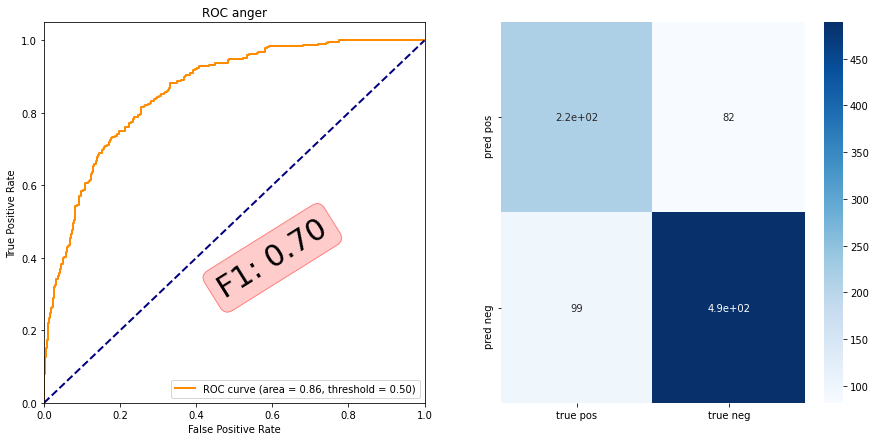

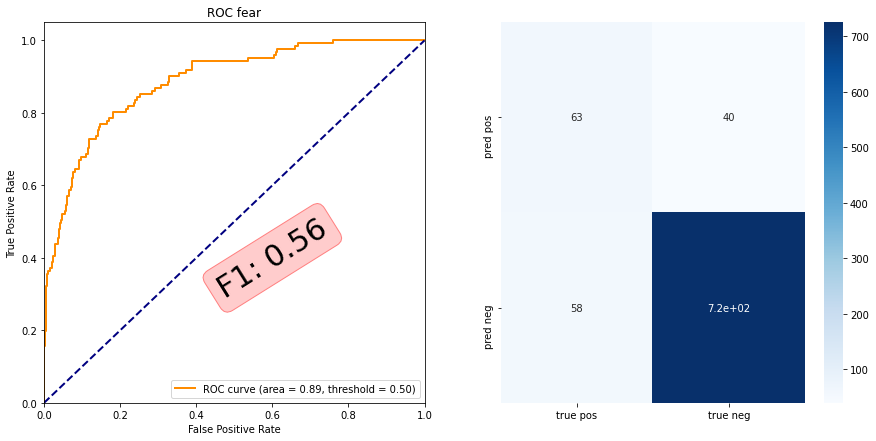

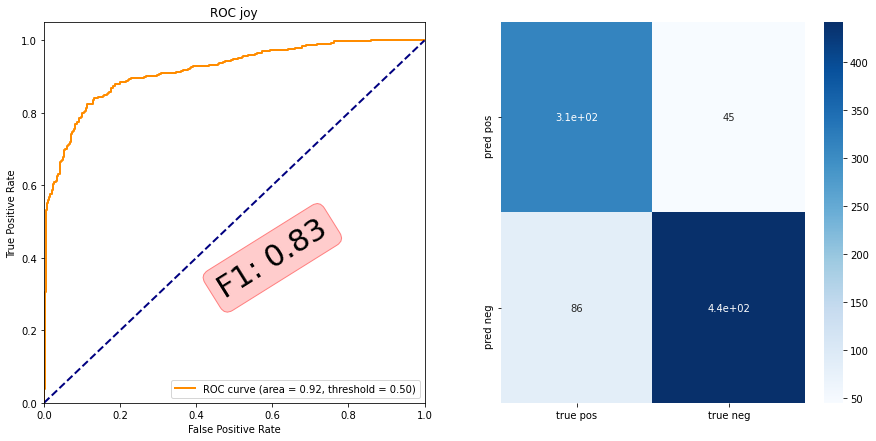

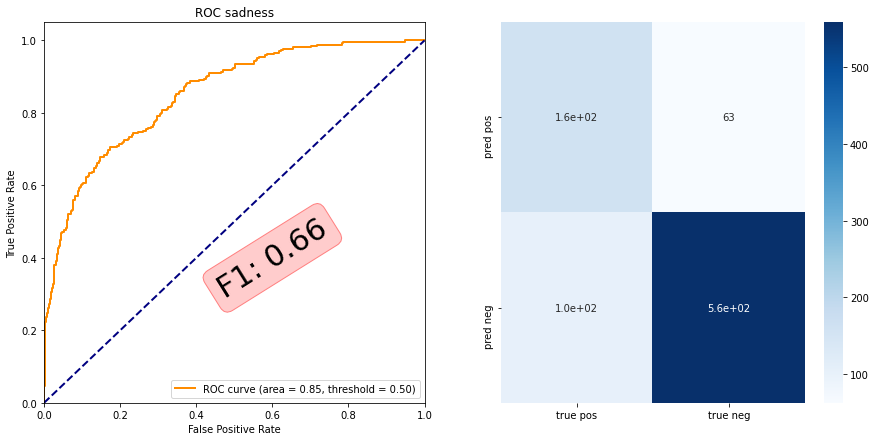

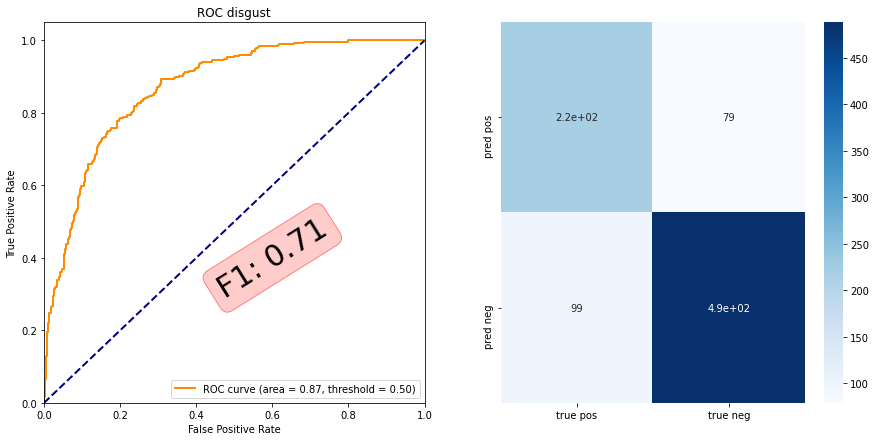

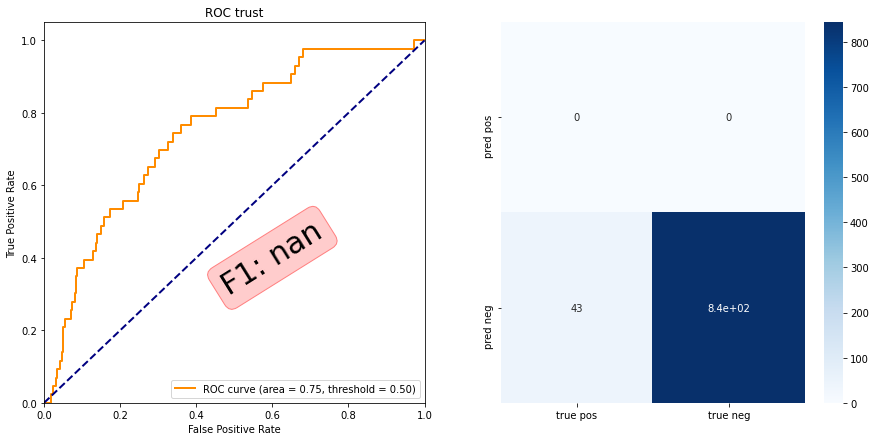

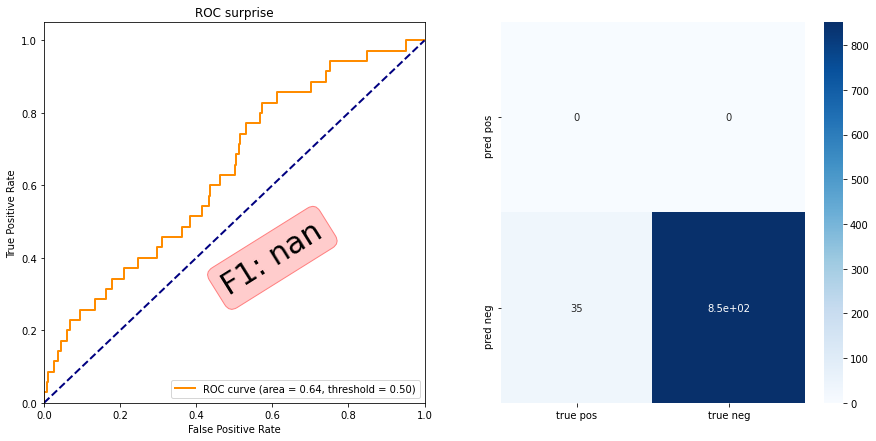

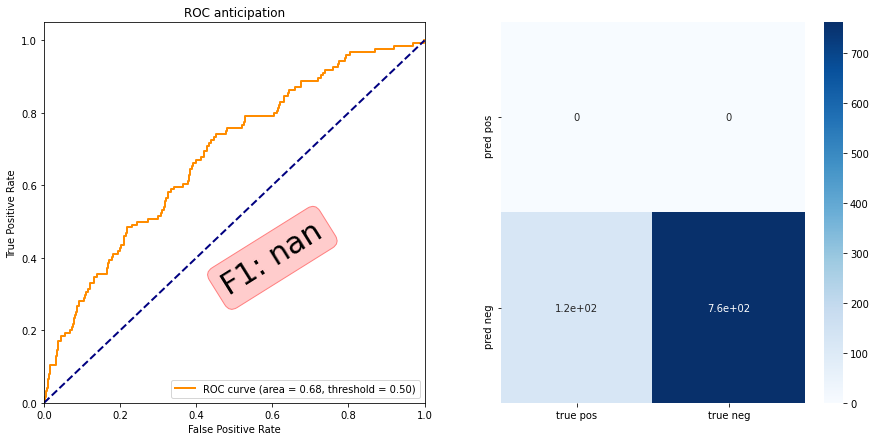

In [20]:
_, val2_preds, val2_targets = mytrainer.get_predictions( val_data_loader_2)
for i,col in enumerate(target_cols):
  targets = (val2_targets[:, i]>0).astype(int)
  plot_roc(col, targets, val2_preds[:, i], 0.5)

In [21]:
_, test_preds, test_targets = mytrainer.get_predictions( test_data_loader)


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

0.7879234167893961 0.7879234167893961 679 TP 114 FP 49 FN 95 TN 421 209 163
acc:0.79, precision: 0.70, recall: 0.55, f1: 0.61
0.9160530191458026 0.9160530191458026 679 TP 27 FP 10 FN 47 TN 595 74 37
acc:0.92, precision: 0.73, recall: 0.36, f1: 0.49
0.8512518409425626 0.8512518409425626 679 TP 153 FP 53 FN 48 TN 425 201 206
acc:0.85, precision: 0.74, recall: 0.76, f1: 0.75
0.8394698085419735 0.8394698085419735 679 TP 75 FP 41 FN 68 TN 495 143 116
acc:0.84, precision: 0.65, recall: 0.52, f1: 0.58
0.8600883652430045 0.8600883652430045 679 TP 23 FP 20 FN 75 TN 561 98 43
acc:0.86, precision: 0.53, recall: 0.23, f1: 0.33
0.9543446244477173 0.9543446244477173 679 TP 0 FP 0 FN 31 TN 648 31 0
acc:0.95, precision: nan, recall: 0.00, f1: nan
0.9455081001472754 0.9455081001472754 679 TP 0 FP 0 FN 37 TN 642 37 0
acc:0.95, precision: nan, recall: 0.00, f1: nan


/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP
/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP


0.8615611192930781 0.8615611192930781 679 TP 0 FP 0 FN 94 TN 585 94 0
acc:0.86, precision: nan, recall: 0.00, f1: nan


/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP


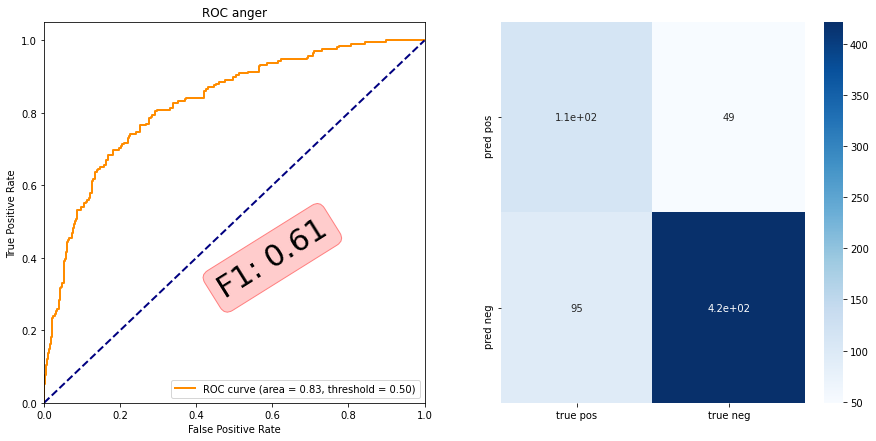

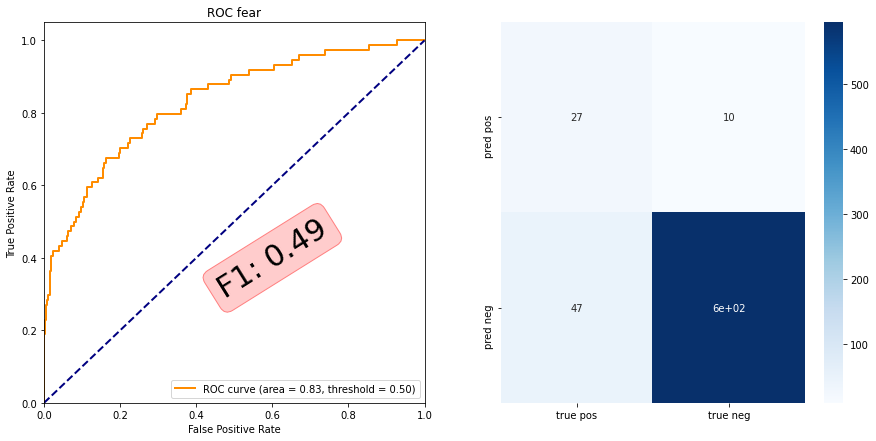

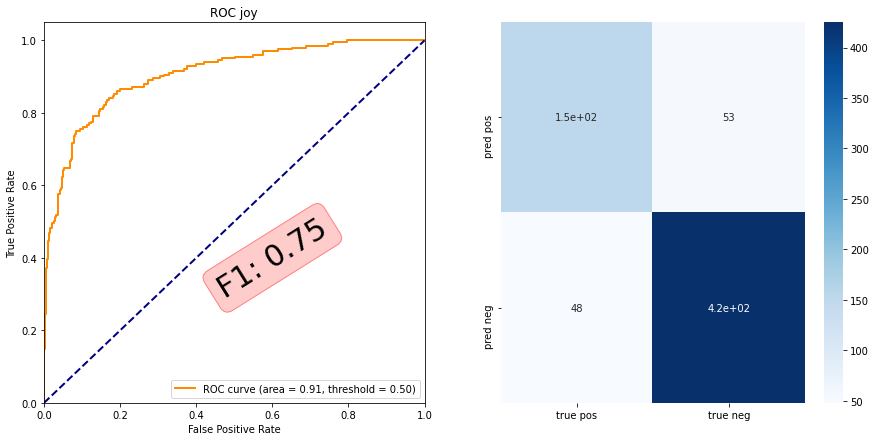

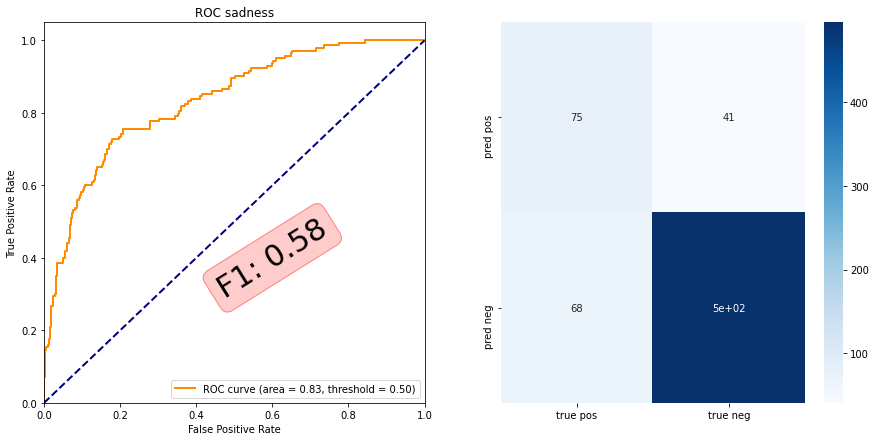

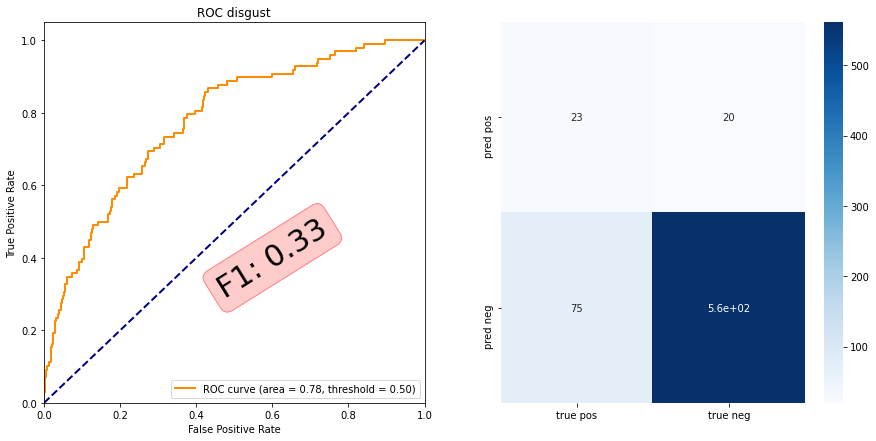

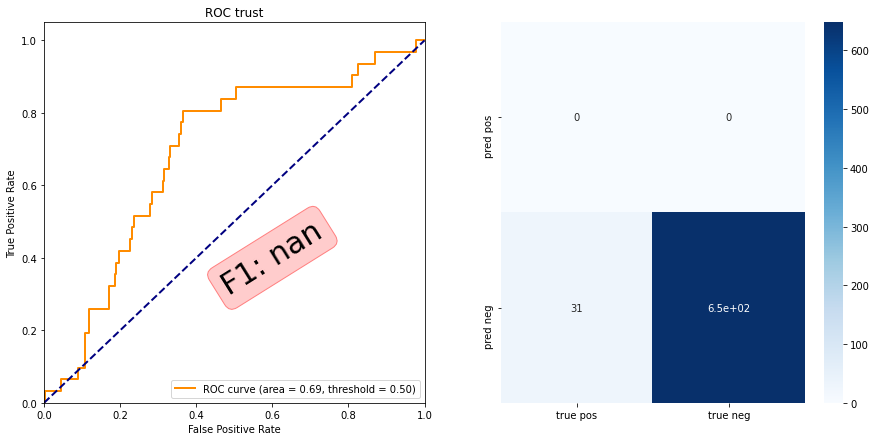

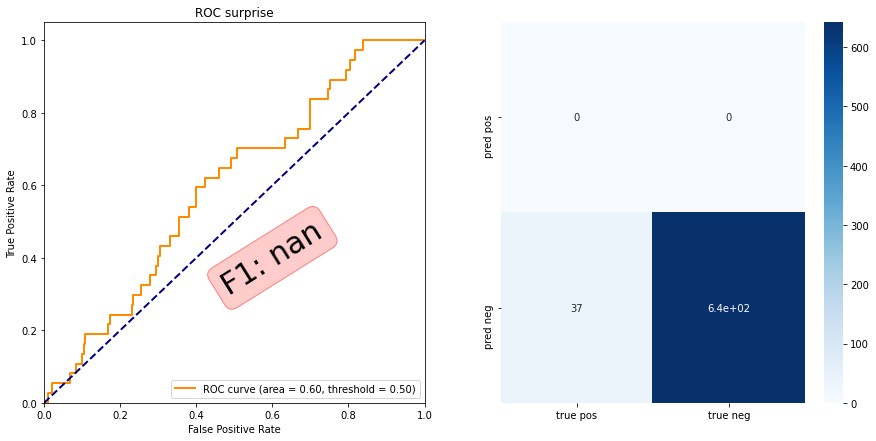

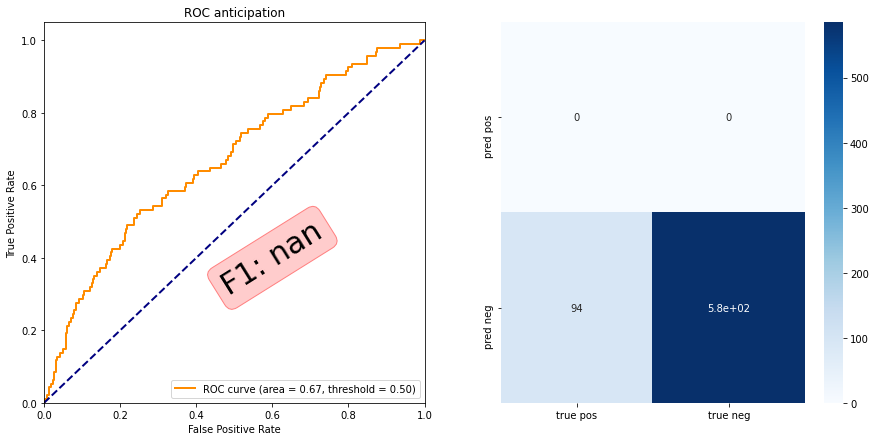

In [22]:
for i,col in enumerate(target_cols):
  targets = (test_targets[:, i]>0).astype(int)
  plot_roc(col, targets, test_preds[:, i], 0.5)


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

0.7932722480230953 0.7932722480230953 15934 TP 4501 FP 2096 FN 1198 TN 8139 5699 6597
acc:0.79, precision: 0.68, recall: 0.79, f1: 0.73
0.8134806075059621 0.8134806075059621 15934 TP 1842 FP 2323 FN 649 TN 11120 2491 4165
acc:0.81, precision: 0.44, recall: 0.74, f1: 0.55
0.8544621563951299 0.8544621563951299 15934 TP 4742 FP 1452 FN 867 TN 8873 5609 6194
acc:0.85, precision: 0.77, recall: 0.85, f1: 0.80
0.7677293837077946 0.7677293837077946 15934 TP 3500 FP 2546 FN 1155 TN 8733 4655 6046
acc:0.77, precision: 0.58, recall: 0.75, f1: 0.65
0.7850508346931091 0.7850508346931091 15934 TP 3695 FP 2465 FN 960 TN 8814 4655 6160
acc:0.79, precision: 0.60, recall: 0.79, f1: 0.68
0.6506840717961592 0.6506840717961592 15934 TP 613 FP 5374 FN 192 TN 9755 805 5987
acc:0.65, precision: 0.10, recall: 0.76, f1: 0.18
0.7605121124639136 0.7605121124639136 15934 TP 320 FP 3389 FN 427 TN 11798 747 3709
acc:0.76, precision: 0.09, recall: 0.43, f1: 0.14
0.6797414334128279 0.6797414334128279 15934 TP 1298 FP 

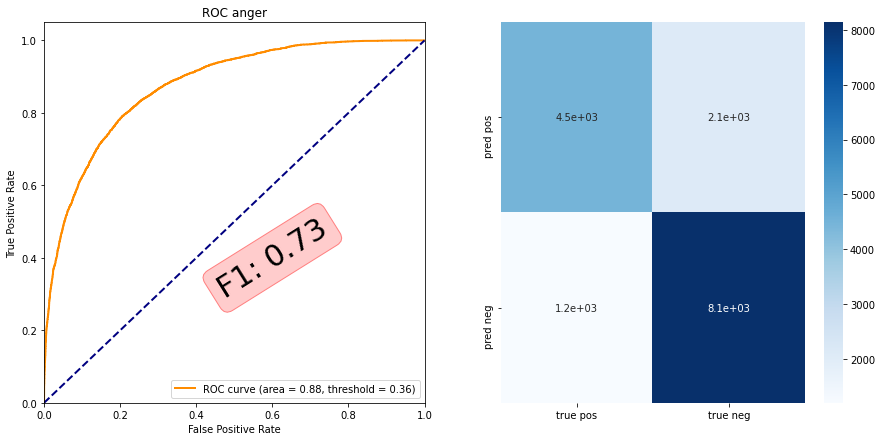

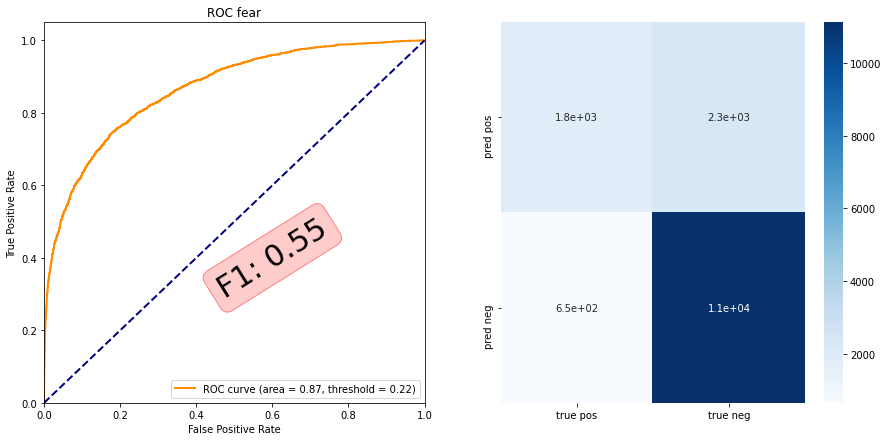

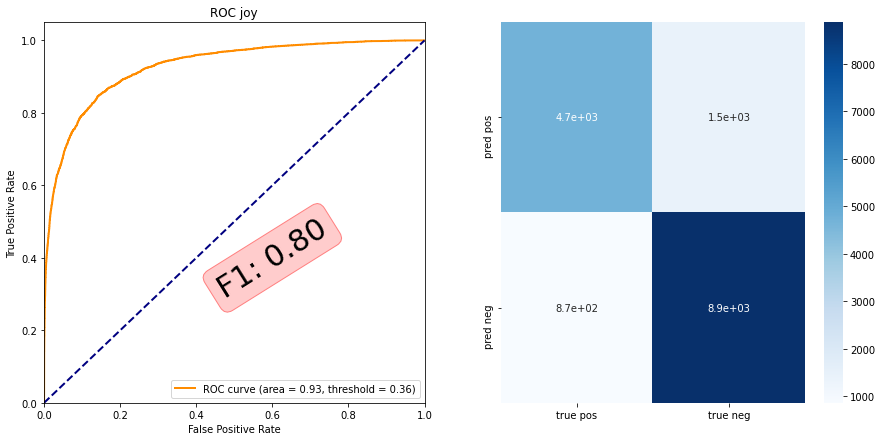

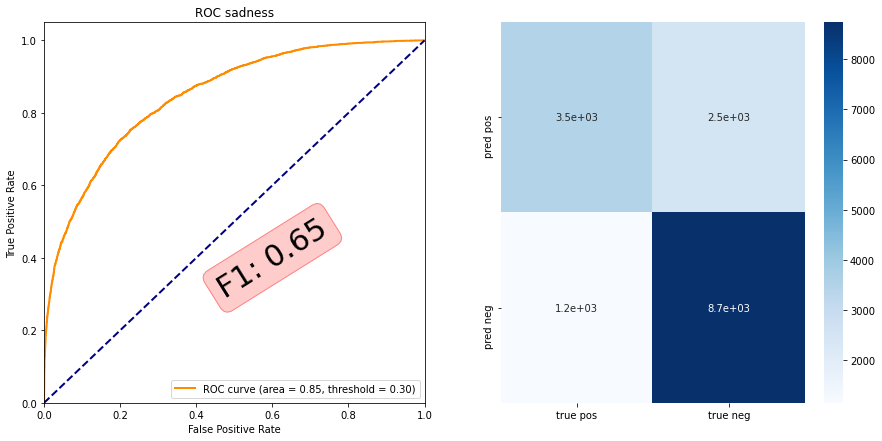

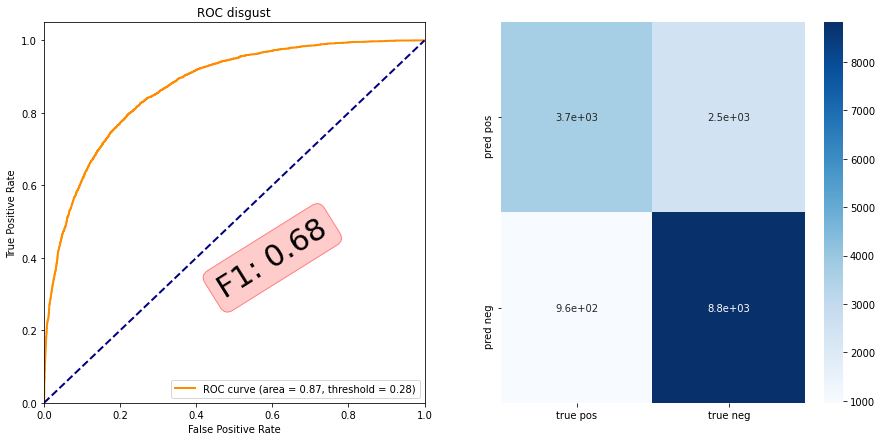

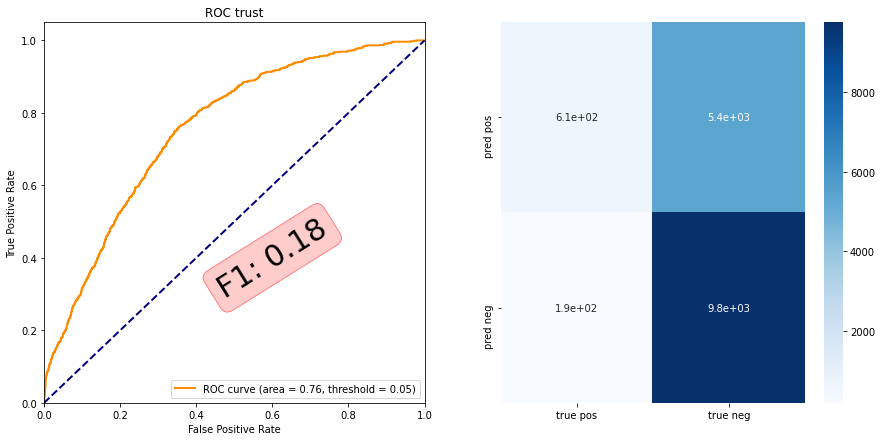

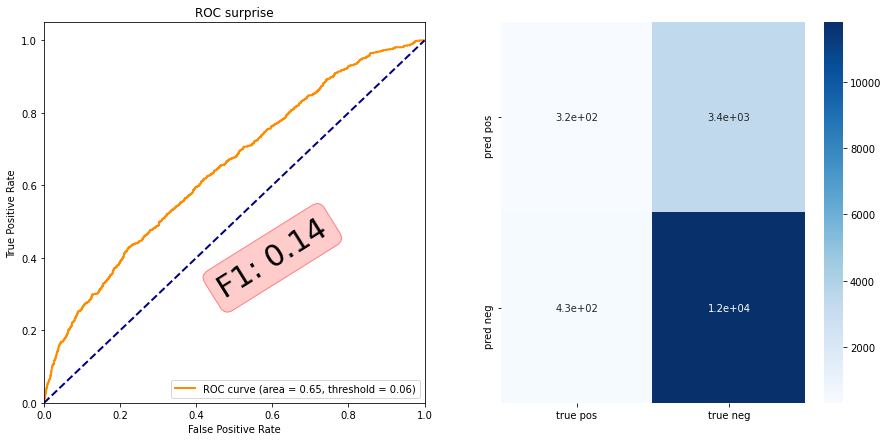

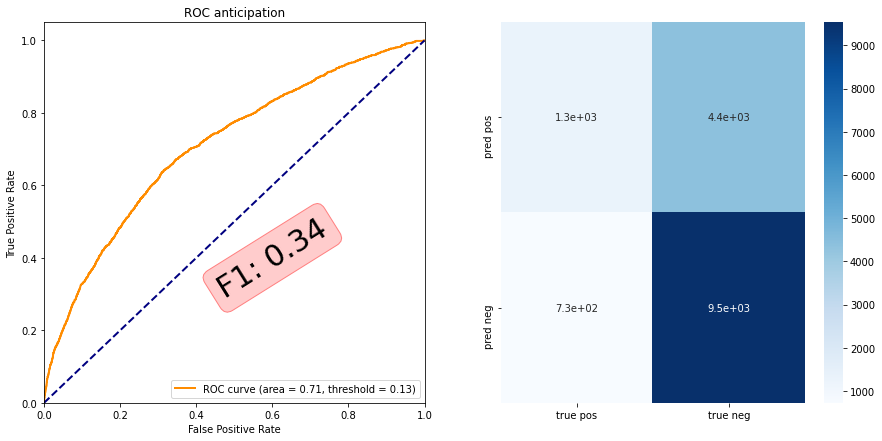

In [23]:
_, train_preds, train_targets = mytrainer.get_predictions( train_data_loader)

fpr = dict()
tpr = dict()
optimal_threshold = dict()
optimal_acc = dict()
result = []
roc_auc = dict()


for i,col in enumerate(target_cols):
    targets = (train_targets[:, i]>0).astype(int)

    fpr[i], tpr[i], thresholds = roc_curve(targets, train_preds[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    optimal_threshold[i] = thresholds[np.argmax(tpr[i]-fpr[i])]
    plot_roc(col, targets, train_preds[:, i], optimal_threshold[i])

0.8030626333626208 0.8030626333626208 15934 TP 3849 FP 1288 FN 1850 TN 8947 5699 5137
acc:0.80, precision: 0.75, recall: 0.68, f1: 0.71
0.8874105685954563 0.8874105685954563 15934 TP 1141 FP 444 FN 1350 TN 12999 2491 1585
acc:0.89, precision: 0.72, recall: 0.46, f1: 0.56
0.8626208108447345 0.8626208108447345 15934 TP 4451 FP 1031 FN 1158 TN 9294 5609 5482
acc:0.86, precision: 0.81, recall: 0.79, f1: 0.80
0.8038157399271997 0.8038157399271997 15934 TP 2564 FP 1035 FN 2091 TN 10244 4655 3599
acc:0.80, precision: 0.71, recall: 0.55, f1: 0.62
0.8168695870465671 0.8168695870465671 15934 TP 2840 FP 1103 FN 1815 TN 10176 4655 3943
acc:0.82, precision: 0.72, recall: 0.61, f1: 0.66
0.949479101292833 0.949479101292833 15934 TP 0 FP 0 FN 805 TN 15129 805 0
acc:0.95, precision: nan, recall: 0.00, f1: nan


/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP
/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP


0.9531191163549643 0.9531191163549643 15934 TP 0 FP 0 FN 747 TN 15187 747 0
acc:0.95, precision: nan, recall: 0.00, f1: nan
0.8729760261076942 0.8729760261076942 15934 TP 0 FP 0 FN 2024 TN 13910 2024 0
acc:0.87, precision: nan, recall: 0.00, f1: nan


/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP


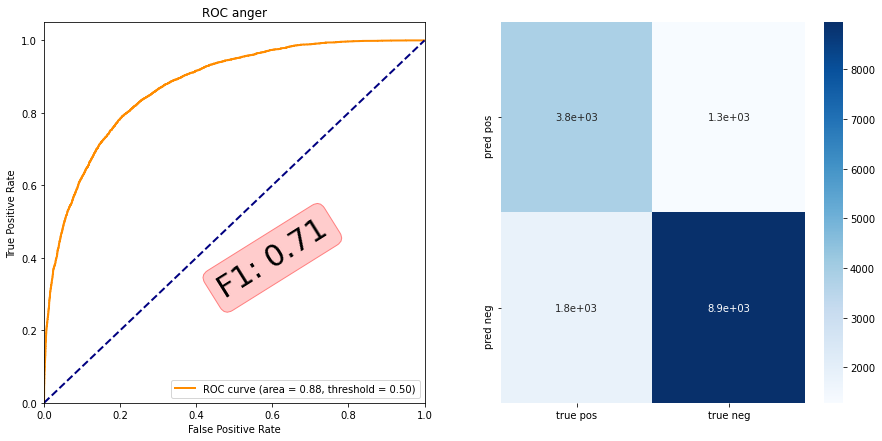

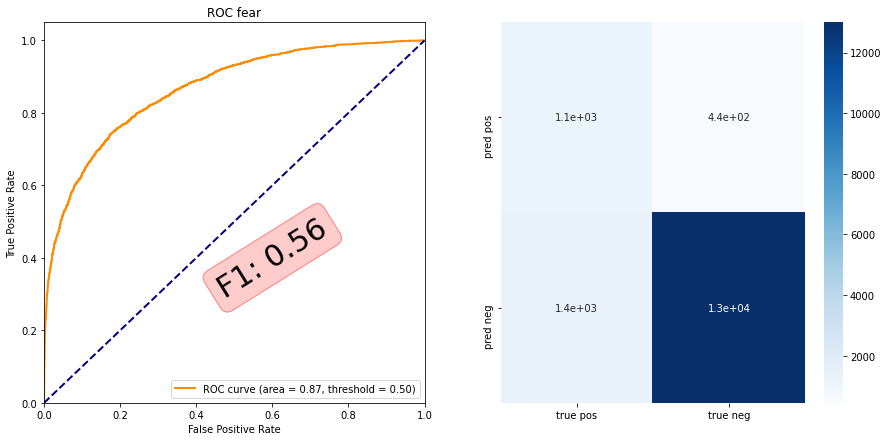

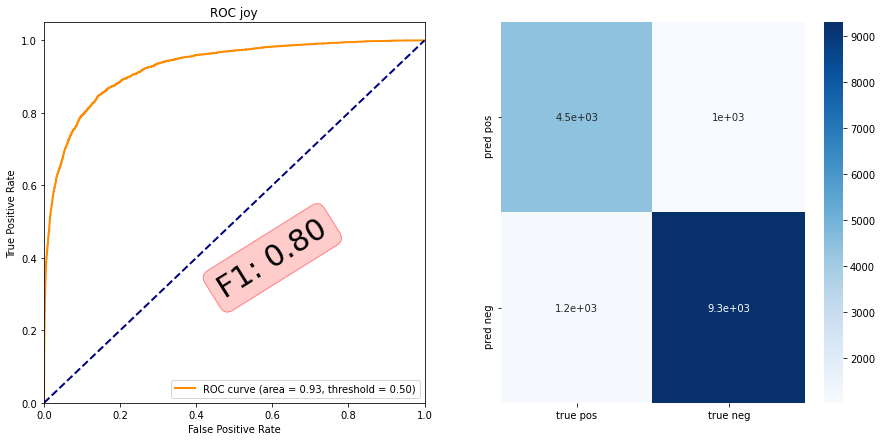

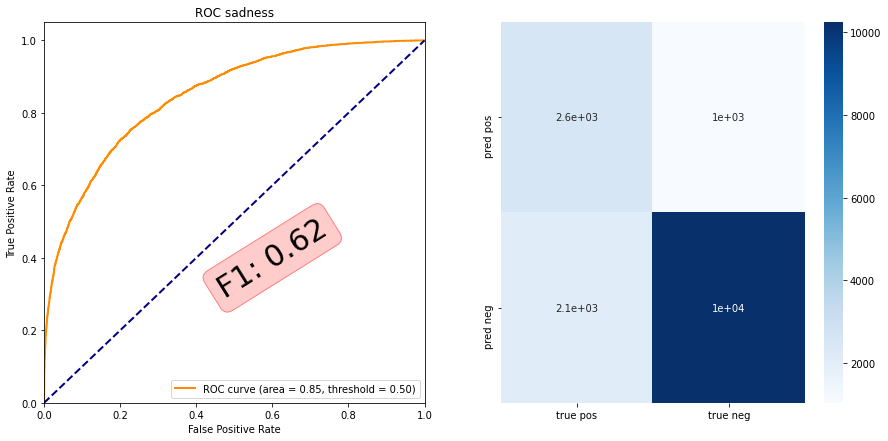

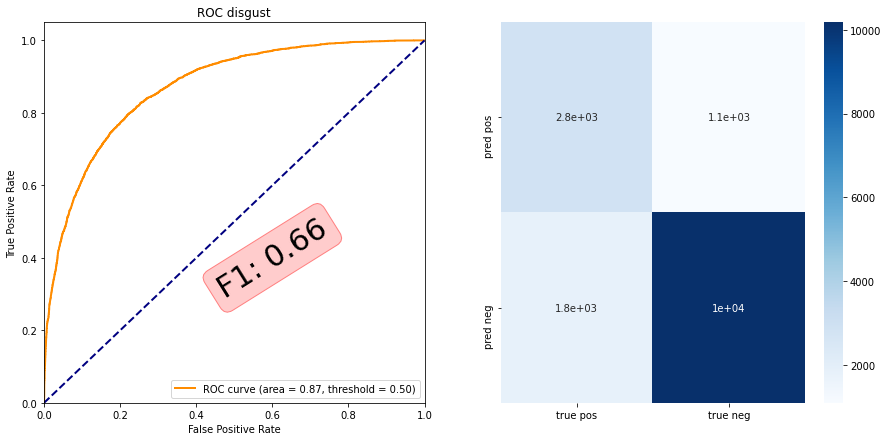

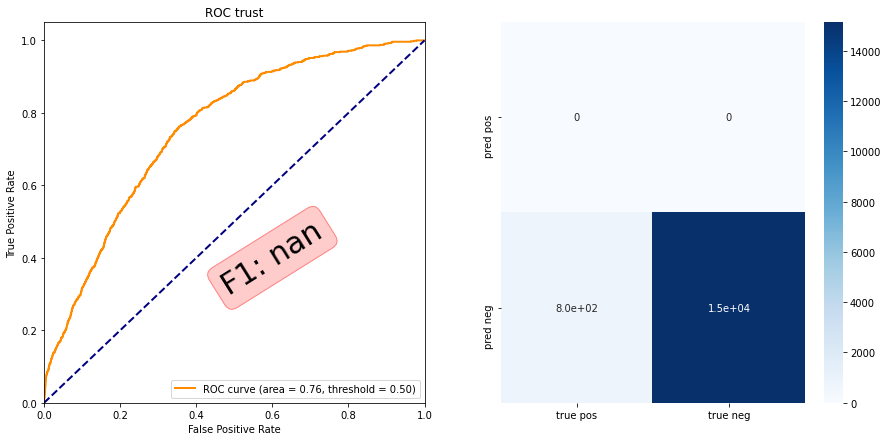

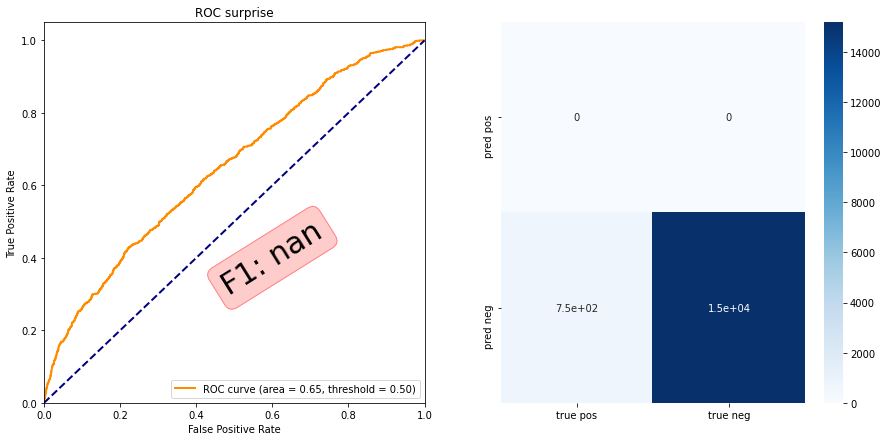

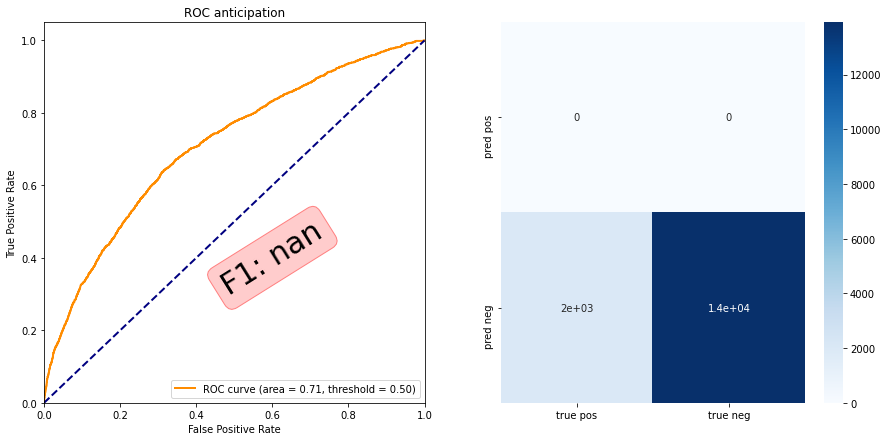

In [24]:

for i,col in enumerate(target_cols):
    targets = (train_targets[:, i]>0).astype(int)

    fpr[i], tpr[i], thresholds = roc_curve(targets, train_preds[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    optimal_threshold[i] = thresholds[np.argmax(tpr[i]-fpr[i])]
    plot_roc(col, targets, train_preds[:, i], 0.5)

In [25]:
_, val_preds, val_targets = mytrainer.get_predictions( val_data_loader)


/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,
/usr/local/lib/python3.6/dist-packages/transformers/tokenization_utils_base.py:1770: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input si

0.8 0.8 585 TP 135 FP 37 FN 80 TN 333 215 172
acc:0.80, precision: 0.78, recall: 0.63, f1: 0.70
0.8683760683760684 0.8683760683760684 585 TP 30 FP 13 FN 64 TN 478 94 43
acc:0.87, precision: 0.70, recall: 0.32, f1: 0.44
0.8512820512820513 0.8512820512820513 585 TP 136 FP 44 FN 43 TN 362 179 180
acc:0.85, precision: 0.76, recall: 0.76, f1: 0.76
0.7264957264957265 0.7264957264957265 585 TP 97 FP 40 FN 120 TN 328 217 137
acc:0.73, precision: 0.71, recall: 0.45, f1: 0.55
0.8239316239316239 0.8239316239316239 585 TP 34 FP 31 FN 72 TN 448 106 65
acc:0.82, precision: 0.52, recall: 0.32, f1: 0.40
0.9384615384615385 0.9384615384615385 585 TP 0 FP 0 FN 36 TN 549 36 0
acc:0.94, precision: nan, recall: 0.00, f1: nan
0.9777777777777777 0.9777777777777777 585 TP 0 FP 0 FN 13 TN 572 13 0
acc:0.98, precision: nan, recall: 0.00, f1: nan


/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP
/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP


0.9025641025641026 0.9025641025641026 585 TP 0 FP 0 FN 57 TN 528 57 0
acc:0.90, precision: nan, recall: 0.00, f1: nan


/content/drive/My Drive/visualing.py:26: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP/PP


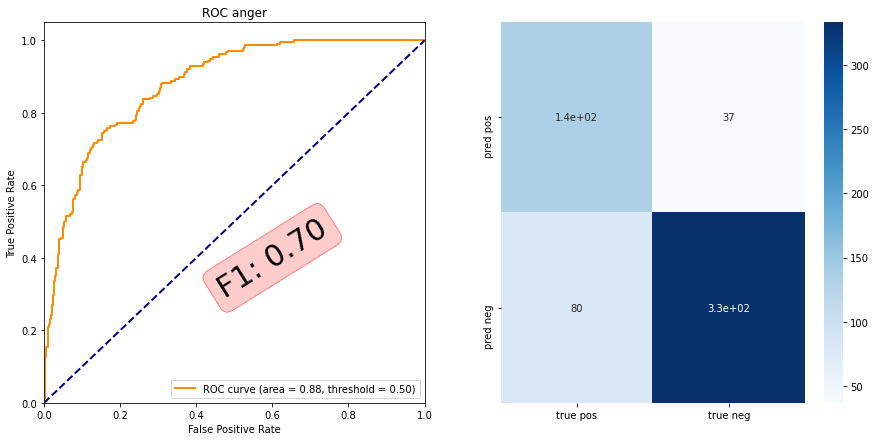

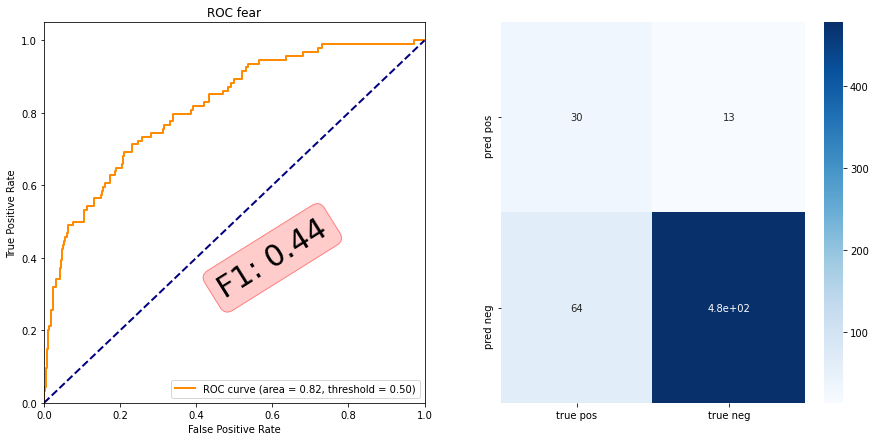

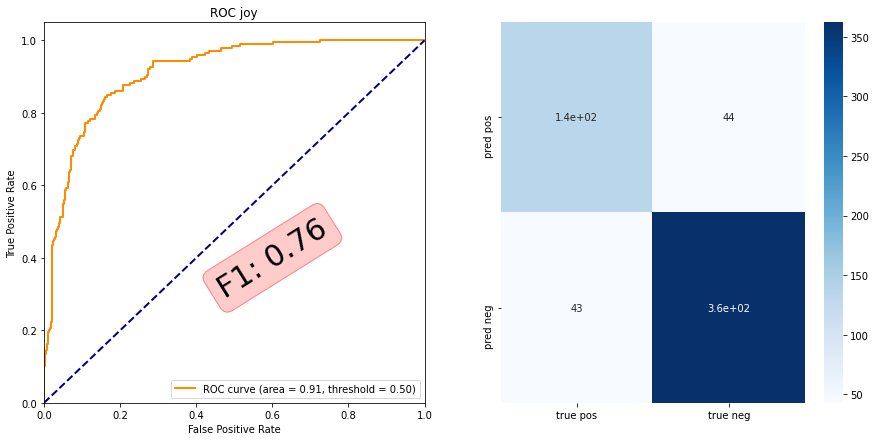

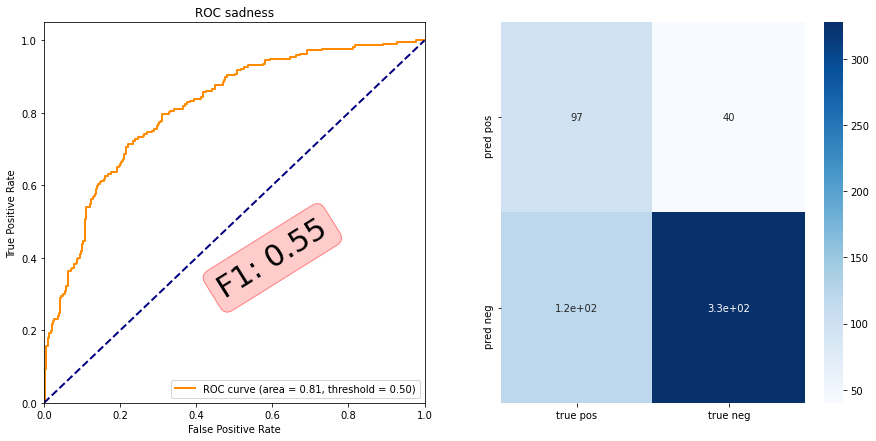

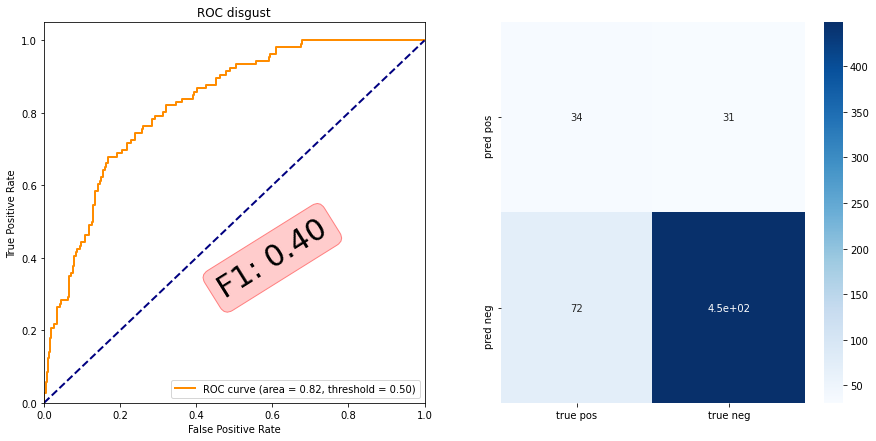

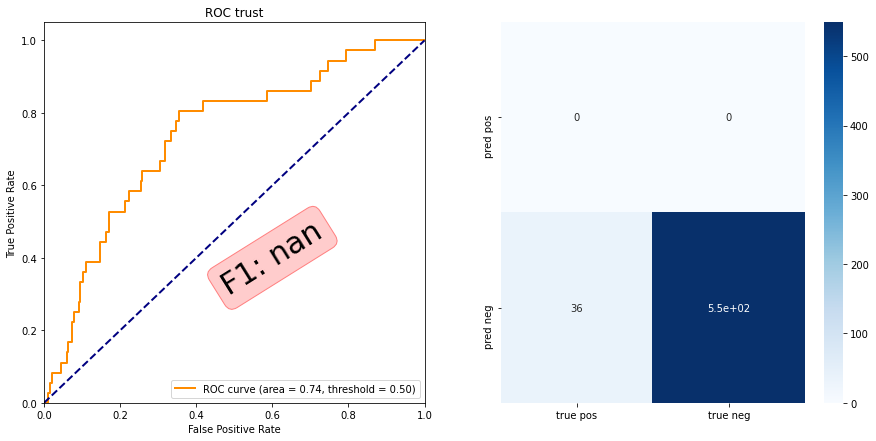

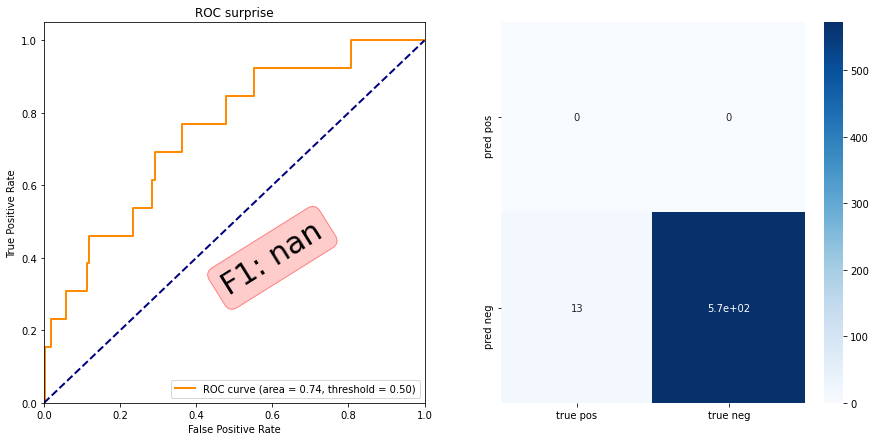

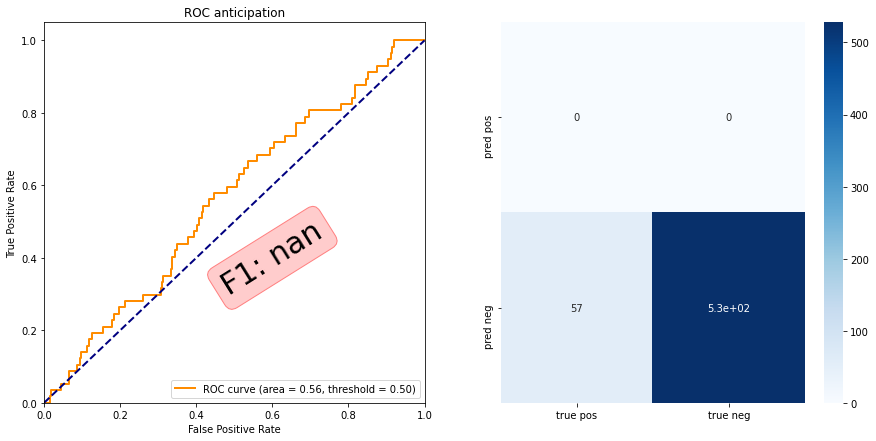

In [26]:

for i,col in enumerate(target_cols):
  targets = (val_targets[:, i]>0).astype(int)
  plot_roc(col, targets, val_preds[:, i], 0.5)



In [27]:
#sns.color_palette("light:b", as_cmap=True)
##sns.cubehelix_palette(as_cmap=True)

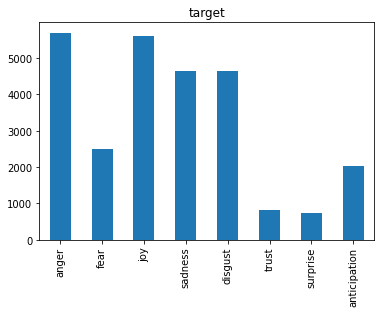

Text(0.5, 1.0, 'pred')

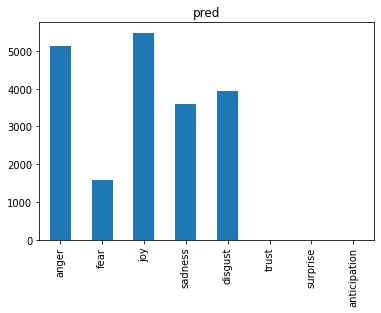

In [28]:
train_days = pd.DataFrame(train_targets, columns=target_cols)
#print('train',train_days.sum())
train_predf = pd.DataFrame(train_preds, columns=target_cols)
for i,col in enumerate(target_cols):
  train_predf[col]=(train_predf[col]>0.5).astype(int)#optimal_threshold[i]).astype(int)
#print('pred',train_preds.sum())
train_days.sum().plot.bar()
plt.title('target')
plt.show()
train_predf.sum().plot.bar()
plt.title('pred')

In [29]:

days = pd.DataFrame(val_preds, columns=target_cols)
tru_days = pd.DataFrame(val_targets, columns=target_cols)

for i in range(len(target_cols)):
  days[target_cols[i]] = (days[target_cols[i]]>0.5).astype(int)
days['day'] = days.index%4
tru_days['day'] = tru_days.index%4

precision={}
recall={}
for col in target_cols:
  day0preds = days[(days.day==0)][col]
  day0targets = tru_days[tru_days.day==0][col] 
  tp = (day0preds*day0targets).sum()
  precision[col] = tp/day0preds.sum()
  recall[col] = tp/day0targets.sum()
  print('%s, true positive %f, pred pos %f, pos %f, precision %f, recall %f'%(col, tp, day0preds.sum(), day0targets.sum(), precision[col], recall[col]))

  # # precision = ppv = true positive / predicted positive 
   # recall = sensitivity = TPR = true positive/ positive


anger, true positive 30.000000, pred pos 43.000000, pos 55.000000, precision 0.697674, recall 0.545455
fear, true positive 9.000000, pred pos 11.000000, pos 25.000000, precision 0.818182, recall 0.360000
joy, true positive 31.000000, pred pos 42.000000, pos 43.000000, precision 0.738095, recall 0.720930
sadness, true positive 30.000000, pred pos 36.000000, pos 58.000000, precision 0.833333, recall 0.517241
disgust, true positive 4.000000, pred pos 9.000000, pos 23.000000, precision 0.444444, recall 0.173913
trust, true positive 0.000000, pred pos 0.000000, pos 8.000000, precision nan, recall 0.000000
surprise, true positive 0.000000, pred pos 0.000000, pos 2.000000, precision nan, recall 0.000000
anticipation, true positive 0.000000, pred pos 0.000000, pos 16.000000, precision nan, recall 0.000000


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in long_scalars
  app.launch_new_instance()


NameError: ignored

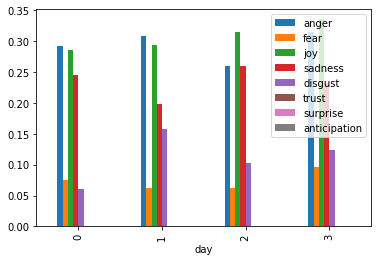

In [30]:

gpred = days.groupby('day').mean().plot.bar()
plt.title('predicted '+str(train_size))
plt.ylim(0,0.5)
gtru = tru_days.groupby('day').mean().plot.bar()
plt.title('true')

## Performance in a diffrent Language


In [ ]:
train_ar_loader = create_data_loader(semar_train_df,text_col, target_cols, tokenizer, MAX_LEN, BATCH_SIZE, shuffle=True)
val_ar_loader = create_data_loader(semar_dev_df,text_col, target_cols, tokenizer, MAX_LEN, BATCH_SIZE)

In [ ]:
_, ar_preds, ar_targets = get_predictions(model, train_ar_loader)

In [ ]:
for i,col in enumerate(target_cols):
  plot_roc(col, ar_targets[:, i], ar_preds[:, i], optimal_threshold[i])


### Smile DataSet


In [ ]:
smile = pd.read_csv('/content/smile-annotations-final.csv', header=None, names=['id','text','emo'])
smile = pd.concat([smile, pd.get_dummies(smile.emo)], axis=1)
smile.head()
smile['angry'] += smile['disgust|angry']+smile['sad|angry']+smile['sad|disgust|angry']
smile['disgust']+=smile['disgust|angry']+smile['sad|disgust']+smile['sad|disgust|angry']
smile['happy']+=smile['happy|sad']+smile['happy|surprise']
smile['sad']+=smile['happy|sad']+smile['sad|angry']+smile['sad|disgust']+smile['sad|disgust|angry']
smile['surprise']+=smile['happy|surprise']
smile = smile.drop(columns=['disgust|angry','happy|sad','happy|surprise','sad|angry','sad|disgust','sad|disgust|angry','nocode','not-relevant'])
emo_cols = ['anger','disgust','joy','sadness','surprise']
smile.columns=['id', 'text', 'emo']+emo_cols
for col in target_cols:
  if col not in emo_cols:
    smile[col] = 0
display(smile.head())

smile[emo_cols].sum().plot.bar()

In [ ]:
smile.head(n=20)

In [ ]:
smile['text'] = smile.text.apply(clean)
smile_data_loader = create_data_loader(smile, 'text', target_cols, tokenizer, MAX_LEN, BATCH_SIZE)
_, sm_preds, sm_targets = get_predictions(model, smile_data_loader)


In [ ]:
fakes = ((sm_preds>0.5).astype(int)!=sm_targets).any(axis=1)
print(fakes.mean())
accu = ((sm_preds>0.5).astype(int)==sm_targets).sum()/(sm_targets.shape[0]*sm_targets.shape[1])
print(accu)
pred_df = pd.DataFrame(sm_preds, columns=target_cols)
smile = pd.concat([smile, pred_df], axis=1)
smile[fakes].head(n=5)

In [ ]:
for i,col in enumerate(target_cols):
    if col in emo_cols:
      plot_roc(col, sm_targets[:, i], sm_preds[:, i], 0.5)


## twitter data


In [ ]:
tweets = pd.read_csv('/temp_tweets_text.csv')
print(tweets.head())
print(tweets.shape)
tweets['text'] = tweets.text.apply(clean)


In [ ]:
%%time 
tw_data_loader = create_data_loader(tweets, 'text', [], tokenizer, MAX_LEN, BATCH_SIZE)
_, tw_preds, _ = get_predictions(model, tw_data_loader)

In [ ]:
pred_df = pd.DataFrame(tw_preds, columns= target_cols)



In [ ]:
print(tweets.shape)
tweets2 = pd.concat([tweets, pred_df], axis=1)
print(tweets2.shape)


In [ ]:
#tweets2 = tweets2.drop(columns=['Unnamed: 0'])
tweets2.to_csv('twitter_tweets_pred.csv')

In [ ]:
!pwd

In [ ]:
display(tweets2.head())
for col in target_cols:
  tweets2[col] = (tweets2[col]>0.5).astype(int)


In [ ]:
tweets2['neutral'] = (tweets2[target_cols].sum(axis=1)==0).astype(int)
tweets2.groupby('date')[target_cols+['neutral']].sum().plot()

In [ ]:
tweets2['timestamp'] = pd.to_datetime(tweets2['timestamp'])
tweets2['month'] = tweets2.timestamp.dt.month
tweets2['week'] = tweets2.timestamp.dt.weekofyear

display(tweets2.head())
tweetsplot = tweets2.groupby('week')[target_cols+['neutral']].sum()
tweetsplot.plot.area()

In [ ]:
tweetsplot.div(tweetsplot.sum(axis=1), axis=0).plot.area()
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))


In [ ]:
!pip install bokeh

In [ ]:
!pip install chord
from chord import Chord


In [ ]:
matrix = tweets2[target_cols].corr()
matrix[matrix < 0] = 0
matrix[matrix.isnull()] = 0
matrix = matrix.multiply(100).astype(int)
matrix = matrix.values.tolist()
matrix

In [ ]:
#https://towardsdatascience.com/create-beautiful-and-interactive-chord-diagrams-using-python-cb5ecb092a7c
Chord(matrix, target_cols).show()

In [ ]:
tweets2[(tweets2.disgust==1)&(tweets2.anger==1)]

In [ ]:
tweets2.head(n=10)

ISEAR

In [ ]:

de_ise = pd.read_csv('/content/deISEAR.tsv', sep='\t')
en_ise = pd.read_csv('/content/enISEAR.tsv', sep='\t')

In [ ]:
de_ise.columns = [col.lower() for col in de_ise.columns]
en_ise.columns = [col.lower() for col in en_ise.columns]

sub_target = ['fear', 'joy', 'sadness', 'anger']
sub_target_de = ['angst',	'freude',	'traurigkeit',	'wut']
core_columns = ['sentence_id', 'sentence']
de_ise = de_ise[core_columns+sub_target_de]
de_ise.columns = core_columns+sub_target
en_ise = en_ise[core_columns+sub_target]

for col in sub_target:
  de_ise[col] = (de_ise[col]>0).astype(int)
  en_ise[col] = (en_ise[col]>0).astype(int)

In [ ]:
de_ise['text'] = de_ise.sentence.apply(lambda x: re.sub('Ich fühlt?e ...,?','', x, re.IGNORECASE) )
en_ise['text'] = en_ise.sentence.apply(lambda x: re.sub('I (once )?(felt|feel) ?...','', x, re.IGNORECASE) )
de_data_loader = create_data_loader(de_ise, 'text', target_cols, tokenizer, MAX_LEN, BATCH_SIZE)
_, de_preds, de_targets = get_predictions(model, de_data_loader)
en_data_loader = create_data_loader(en_ise, 'text', target_cols, tokenizer, MAX_LEN, BATCH_SIZE)
_, en_preds, en_targets = get_predictions(model, en_data_loader)


In [ ]:
for i,col in enumerate(target_cols):
   
    plot_roc(col, en_targets[:, i], en_preds[:, i], 0.5)
    plot_roc(col, de_targets[:, i], de_preds[:, i], 0.5)

## Turkish


In [ ]:
turk = pd.read_csv('/content/TURTED.csv', sep='\t')
display(turk.head())
turk.emotion.unique()
turk = pd.concat([turk, pd.get_dummies(turk.emotion)], axis=1)
turk.columns = ['id', 'tw_text', 'emotion', 'fear', 'joy', 'disgust', 'anger', 'sadness', 'surprise']
#['id', 'tw_text', 'emotion', 'korku', 'mutluluk', 'tiksinme', 'öfke','üzüntü', 'şaşırma']


In [ ]:
%%time 
#60 min fuer 195446 zeilen
tk_data_loader = create_data_loader(turk, 'tw_text', target_cols, tokenizer, MAX_LEN, BATCH_SIZE)
_, tk_preds, tk_targets = get_predictions(model, tk_data_loader)

In [ ]:
print(tk_preds[0:10])
tk_targets[0:10]

In [ ]:
for i,col in enumerate(target_cols):
   
    plot_roc(col, tk_targets[:, i], tk_preds[:, i], 0.5)


In [ ]:
test